### **NLP Model with Markov Chains**

**library setting**

In [14]:
# library
import numpy as np
import pandas as pd
import os
import re
import random
import string
from IPython.display import display

# Token trasformation
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

# visualization
import matplotlib.pyplot as plt
import networkx as nx
from scipy.sparse import find


**1. upload file and read file .txt**

1. Imports a file path from a configuration file.
2. It opens the file at that path.
3. It reads the file's contents into a variable.
4. It prints the first 1000 characters of the file's content.

In [15]:
# setting config file to upload file path
from config import file_txt

with open(file_txt, 'r') as file:
   text = file.read()
   
print(text[:1000])

Chapter 1

I am by birth a Genevese, and my family is one of the most
distinguished of that republic.  My ancestors had been for many years
counsellors and syndics, and my father had filled several public
situations with honour and reputation.  He was respected by all who
knew him for his integrity and indefatigable attention to public
business.  He passed his younger days perpetually occupied by the
affairs of his country; a variety of circumstances had prevented his
marrying early, nor was it until the decline of life that he became a
husband and the father of a family.

As the circumstances of his marriage illustrate his character, I cannot
refrain from relating them.  One of his most intimate friends was a
merchant who, from a flourishing state, fell, through numerous
mischances, into poverty.  This man, whose name was Beaufort, was of a
proud and unbending disposition and could not bear to live in poverty
and oblivion in the same country where he had formerly been
distinguished fo

1.    Defines a function to clean up text and extract words.
2.    It processes a given text to remove extra spaces and split it into words.
3.    It prints the total number of words found in the text.

In [16]:
# Removes formatting and multiple spaces
def text_form(text):
   txt_clean = re.sub(r'\s+', ' ', text)
   txt_words = re.findall(r'\b\w+\b', txt_clean)
   return txt_words

txt_words = text_form(text)
print(f'Number of words:',len(txt_words))

Number of words: 69690


**2. Cleaning and arrangement of text in list**

1. Define a function to read a text file and store its non-empty lines in a list.
2. It processes a given text file and creates a list of non-empty lines.
3. It prints the total number of non-empty lines found in the file.

In [17]:
# rows in line
def read_txt(file_txt):
   txt = []
   with open (file_txt) as f:
      for line in f:
         line = line.strip()
         if line != '': txt.append(line)
   return txt

rows_list = read_txt(file_txt)
print('Number of lines: ', len(rows_list))

Number of lines:  5941


In [18]:
display(rows_list[:30])

['Chapter 1',
 'I am by birth a Genevese, and my family is one of the most',
 'distinguished of that republic.  My ancestors had been for many years',
 'counsellors and syndics, and my father had filled several public',
 'situations with honour and reputation.  He was respected by all who',
 'knew him for his integrity and indefatigable attention to public',
 'business.  He passed his younger days perpetually occupied by the',
 'affairs of his country; a variety of circumstances had prevented his',
 'marrying early, nor was it until the decline of life that he became a',
 'husband and the father of a family.',
 'As the circumstances of his marriage illustrate his character, I cannot',
 'refrain from relating them.  One of his most intimate friends was a',
 'merchant who, from a flourishing state, fell, through numerous',
 'mischances, into poverty.  This man, whose name was Beaufort, was of a',
 'proud and unbending disposition and could not bear to live in poverty',
 'and oblivion in 

The code defines a function to clean and tokenize lines of text by removing special characters and converting the text to lowercase.\
It processes a given list of lines to extract and clean words.\
It prints the total number of tokenized words found in the cleaned text.

In [19]:
# removing special characters and transform words in token
def clean_txt(txt):
   cleaned_text = []
   for line in txt:
      line = line.lower()
      line = re.sub(r"[,.\"\'!@#$%^&*(){}?/;`~:<>+=-\\]", "", line)
      tokens = word_tokenize(line, language="english", preserve_line=True)
      words = [word for word in tokens if word.isalpha()]
      cleaned_text+= words
   return cleaned_text

cleaned_txt = clean_txt(rows_list)
print(f'number of tokenized words:',len(cleaned_txt))

number of tokenized words: 69389


In [20]:
display(cleaned_txt[:30])

['chapter',
 'i',
 'am',
 'by',
 'birth',
 'a',
 'genevese',
 'and',
 'my',
 'family',
 'is',
 'one',
 'of',
 'the',
 'most',
 'distinguished',
 'of',
 'that',
 'republic',
 'my',
 'ancestors',
 'had',
 'been',
 'for',
 'many',
 'years',
 'counsellors',
 'and',
 'syndics',
 'and']

**3. Markov Chain Model - Statistical Base NPL Model**

*The implemented Markov model is a probabilistic language model that captures the sequential structure of a set of texts. Specifically, the model analyzes the sequence of words within the clean texts provided and calculates the transition probabilities between n-grams, where an n-gram is a contiguous sequence of n words.*

The function constructs a Markov chain model using n_gram words to define states.\
It builds a dictionary where each state maps to possible next states with their respective transition probabilities.\
The transition probabilities are calculated by normalizing the counts of transitions from each state.

The Markov chain model can be used to generate text by transitioning from one state to another based on the calculated probabilities.

In [21]:
# Defining the model
def MC_model1(cleaned_txt, n_gram=2): # list of cleaned and tokenized words (cleaned_txt) and an optional parameter n_gram (default is 2)
    markov_model = {}
    for i in range(len(cleaned_txt)-n_gram-1): # The loop runs until the second-to-last possible state.
        curr_state, next_state = "", ""
        for j in range(n_gram): # concatenates n_gram words to form curr_state and the next n_gram words to form next_state.
            curr_state += cleaned_txt[i+j] + " "
            next_state += cleaned_txt[i+j+n_gram] + " "
        curr_state = curr_state[:-1] #  remove the trailing space from each state.
        next_state = next_state[:-1] #  remove the trailing space from each state.
        if curr_state not in markov_model: # checks if curr_state is already in the markov_model dictionary
            markov_model[curr_state] = {}
            markov_model[curr_state][next_state] = 1 
        else: # If not, it initializes a new entry. If it is, it updates the count of the transition to next_state.
            if next_state in markov_model[curr_state]:
                markov_model[curr_state][next_state] += 1
            else:
                markov_model[curr_state][next_state] = 1
    
    # calculating transition probabilities
    for curr_state, transition in markov_model.items(): # Iterates over each state and its transitions.
        total = sum(transition.values()) # Sums the counts of all transitions from the current state.
        for state, count in transition.items(): # Iterates over each possible next state and its count.
            markov_model[curr_state][state] = count/total # Converts the count to a probability by dividing by the total count.
        
    return markov_model

In [22]:
# testing model1 by uploading ours tokenized words list 
MC1 = MC_model1(cleaned_txt)
print(f'Number of states:',len(MC1))

Number of states: 39071


some test to check if its everything ok 

In [ ]:
# display(MC1) <- very long result to print, is better avoid for the final presentation

In [81]:
# display(MC1['i am'])

In [25]:
# import pprint
# pprint.pprint(MC1)

### **Transition Graph**

When a Markov chain has many stages, the transition matrix can become very large and most transitions between states may be unlikely. Using a traditional matrix representation, much of the memory space would be occupied by zeros, making resource utilization inefficient. However, with a sparse matrix representation, memory can be saved by storing only the nonzero elements along with their positions, greatly reducing the space required to store the matrix.

Initializes and fills a transition matrix with probabilities from the Markov chain model.\
It then converts this dense matrix into a sparse matrix format for efficient storage and computation.

In [27]:
import numpy as np
import scipy.sparse

# Total number of states
num_states = len(MC1)
states_list = list(MC1.keys()) 

# Transition matrix
transition_matrix = np.zeros((num_states, num_states))

# adding probabilities
for i, state in enumerate(MC1):
    for j, next_state in enumerate(MC1):
        if next_state in MC1[state]:
            transition_matrix[i, j] = MC1[state][next_state]

# sparse matrix
sparse_transition_matrix = scipy.sparse.csr_matrix(transition_matrix)
# This converts the dense transition matrix into a sparse matrix using Compressed Sparse Row (CSR) format.
# Sparse matrices are memory-efficient for storing and manipulating large matrices with many zero entries.

In [28]:
display(states_list[:10])

['chapter i',
 'i am',
 'am by',
 'by birth',
 'birth a',
 'a genevese',
 'genevese and',
 'and my',
 'my family',
 'family is']

In [29]:
display(transition_matrix[:10, :10])

array([[0.        , 0.        , 0.16666667, 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.01075269, 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.5       ,
        0.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        1.        , 0.        , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.5       , 0.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 1.        , 0.        , 0.        ],
       [0.        , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 1.        , 0.        ],
       [0.        , 0.        , 0.       

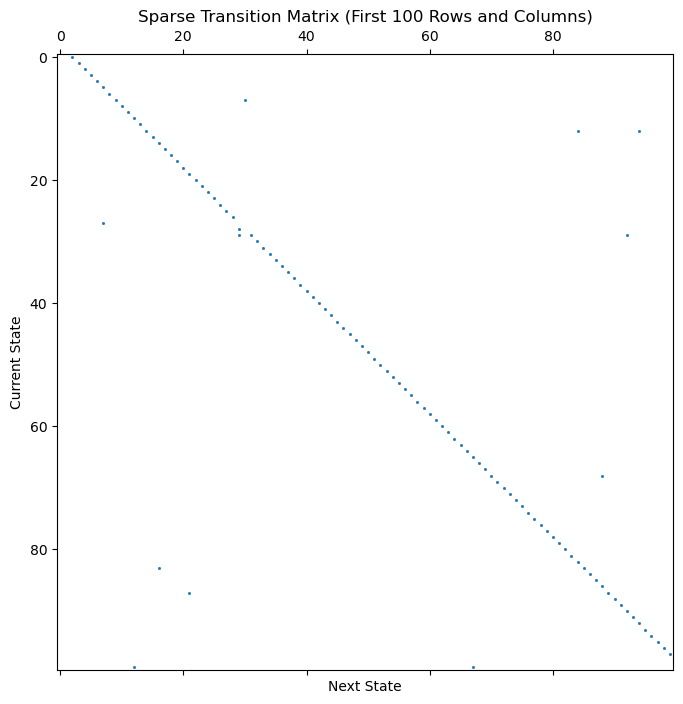

In [30]:
# first 100 matrix values
plt.figure(figsize=(10, 8))
plt.spy(sparse_transition_matrix[:100, :100], markersize=1)
plt.title('Sparse Transition Matrix (First 100 Rows and Columns)')
plt.ylabel('Current State')
plt.xlabel("Next State")
plt.show()

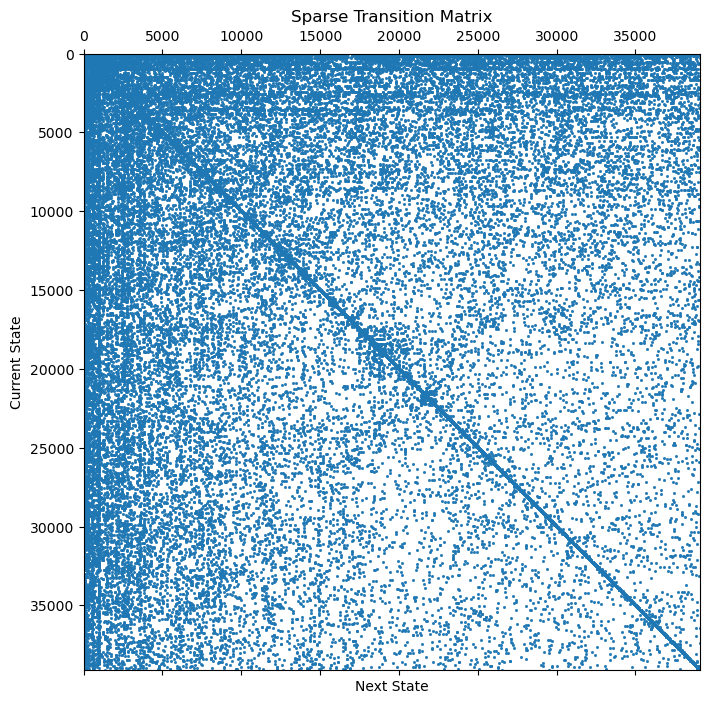

In [31]:
# Sparse matrix visualisation
plt.figure(figsize=(10, 8))
plt.spy(sparse_transition_matrix, markersize=1)
plt.title("Sparse Transition Matrix")
plt.xlabel("Next State")
plt.ylabel("Current State")
plt.show()

After computing the sparse matrix, we use its values to create the transition graph insted of those contained in the initial nested dictionary so as to simplify the computational calculation. In fact, less memory is used with this method and the values are more easily manipulated with linear algebra libraries such as numpy.

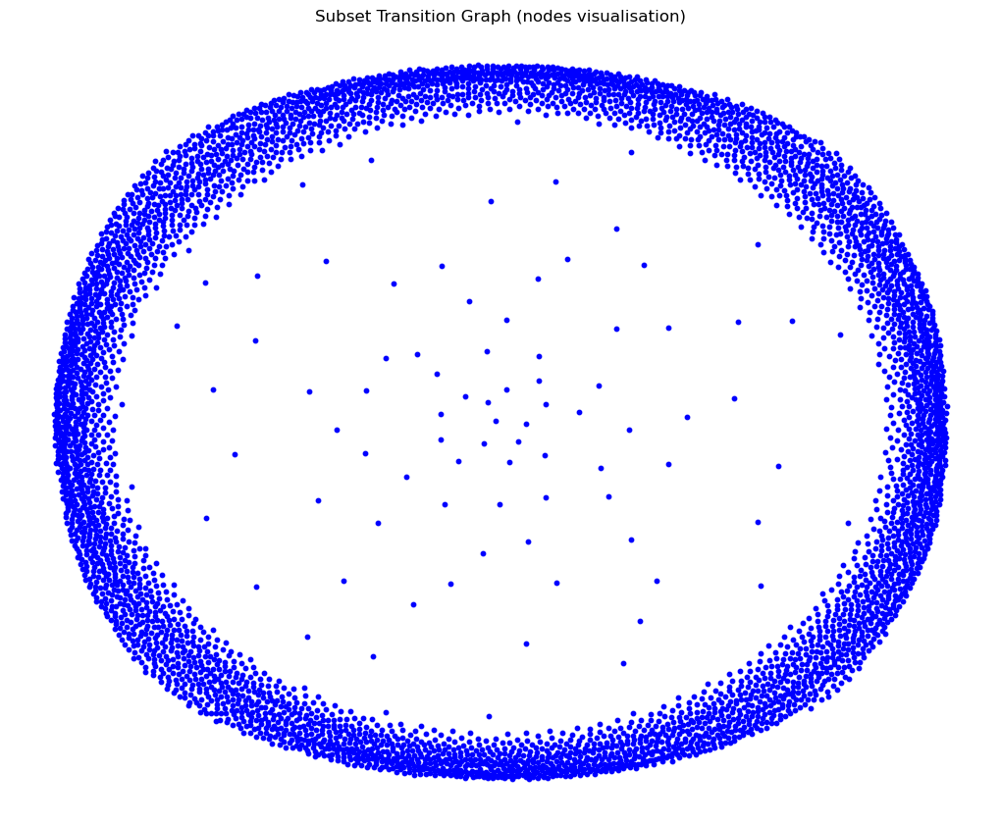

In [34]:
subset_size = 5000  # <-- modify
G = nx.DiGraph()
G.add_nodes_from(range(10000))

# random subset
nodes_list = list(G.nodes())
subset_nodes = random.sample(nodes_list, subset_size)
subset_edges = [(u, v) for u, v in G.edges() if u in subset_nodes and v in subset_nodes]

subset_graph = nx.DiGraph()

# Add nodes
subset_graph.add_nodes_from(subset_nodes)

# Add edges
subset_graph.add_edges_from(subset_edges)

plt.figure(figsize=(10, 8))
pos = nx.spring_layout(subset_graph)
nx.draw(subset_graph, pos, with_labels=False, node_size=10, node_color='blue', edge_color='gray', arrowsize=1)
plt.title('Subset Transition Graph (nodes visualisation)')
plt.show()

this graph is not very illustrative as only the states are represented and not the connections between them. The states also were taken randomly from the sparse matrix. Let us try using a different and more visually efficient structure.

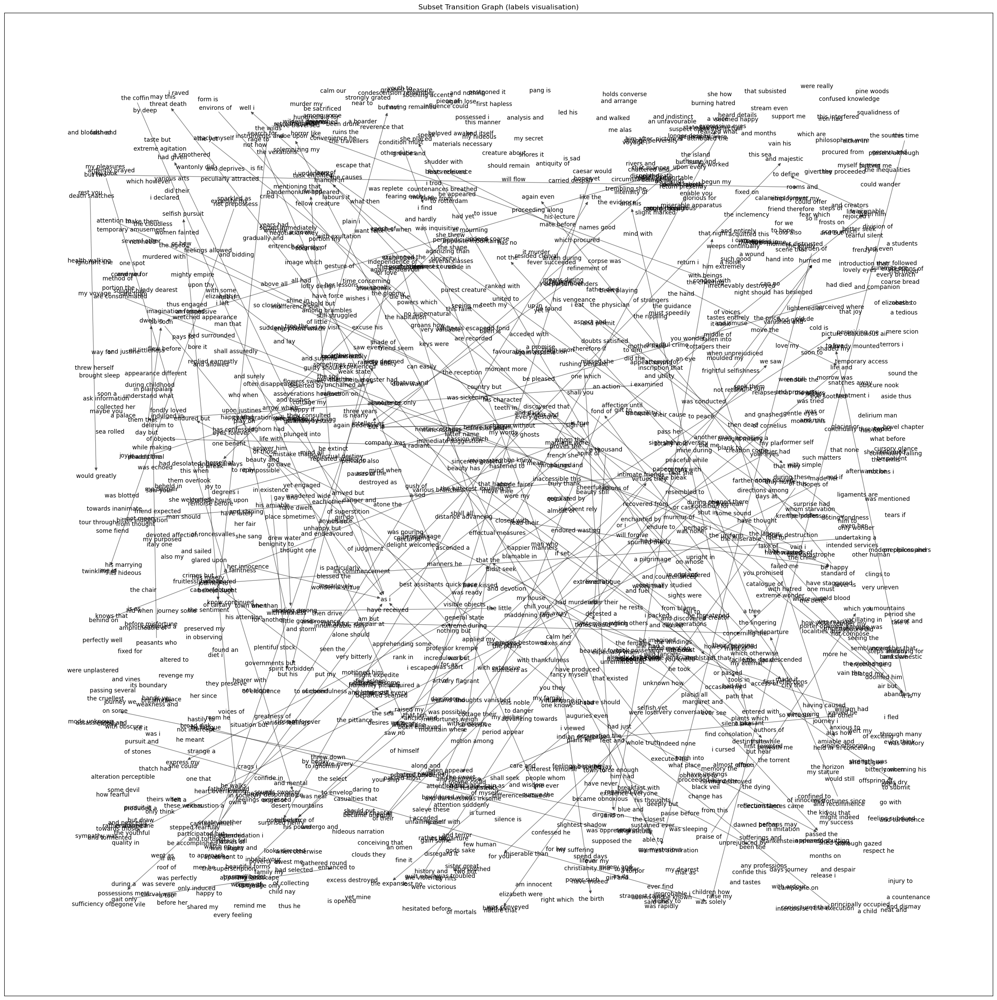

In [35]:
num_selected_states = 1500  # <-- modify
selected_states = random.sample(states_list, num_selected_states)

G = nx.DiGraph()

# Adding nodes
for state in selected_states:
    G.add_node(state)

# Adding edges
row_indices, col_indices, values = find(sparse_transition_matrix)
for i, j, value in zip(row_indices, col_indices, values):
    if states_list[i] in selected_states and states_list[j] in selected_states:
        G.add_edge(states_list[i], states_list[j], weight=value)

# Generation of random positions for nodes
pos = {state: [random.uniform(0, 10), random.uniform(0, 10)] for state in selected_states}

plt.figure(figsize=(30, 30))
plt.title('Subset Transition Graph (labels visualisation)')
nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5)
nx.draw_networkx_labels(G, pos,  font_size=10)
plt.axis('on')
plt.show()

this graph clearly represents states (words) and transitions (arrows). For comprehension only 1500 states were considered. Potentially one could use all the words in the set and check the overall transitions.

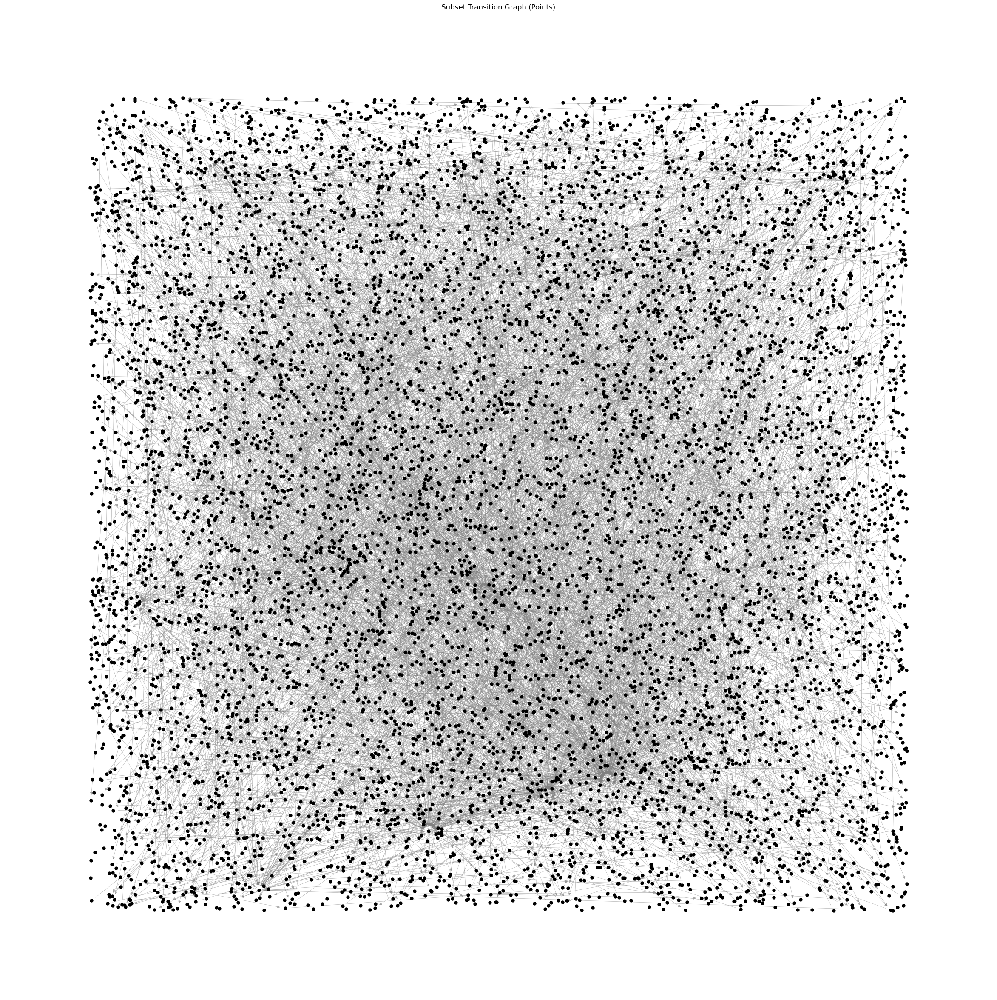

In [36]:
# Select random subset
num_selected_states = 8000  # <-- modify
selected_states = random.sample(states_list, num_selected_states)

G = nx.DiGraph()

# Adding nodes
for state in selected_states:
    G.add_node(state)

# Adding edges
row_indices, col_indices, values = find(sparse_transition_matrix)
for i, j, value in zip(row_indices, col_indices, values):
    if states_list[i] in selected_states and states_list[j] in selected_states:
        G.add_edge(states_list[i], states_list[j], weight=value)

# Generation of random positions for nodes
pos = {state: [random.uniform(0, 10), random.uniform(0, 10)] for state in selected_states}

plt.figure(figsize=(30, 30))
plt.title('Subset Transition Graph (Points)')
node_size = 25
nx.draw_networkx_nodes(G, pos, node_size=node_size, node_color='black')
nx.draw_networkx_edges(G, pos, width=0.5, alpha=0.6, edge_color='gray')
plt.axis('off')
plt.show()

If we modify the visualization of states, changing the labels to points, multiple states can be represented simultaneously in the final representation. The graph is not optimal in that it lacks some clarity, but on a theoretical level it is very functional.

### **Generating Text**

We now proceed with text generation from the result of MC1 (nested dictionary) and then create a function that aggregates multiple tokens based only on probability.

- The function initializes the starting state and constructs a phrase by iteratively selecting the next state based on the transition probabilities in the Markov chain model.
- It generates a sequence of words up to the specified limit and returns the generated text.

In [38]:
# def function
def generate_text(markov_model, limit = 100, start='i am'):
   n = 0
   curr_state = start
   next_state = None
   phrase = ""
   phrase += curr_state + " " # initialise variables before the while loop
   while n<limit:
      # randomly select a state from the possible next states with prob evaluate in Markov Model with random.choice()
      next_state = random.choices(list(markov_model[curr_state].keys()), list(markov_model[curr_state].values()))
      curr_state = next_state[0]
      phrase += curr_state + " "
      n += 1 # update the states
   return phrase

This function relies on the random.choices function to select the next state based on the transition probabilities defined in the Markov model, ensuring that the text generation follows the statistical properties of the input data.

In [ ]:
# consider this promt:
# 'by birth', 'a genevese','genevese and','distinguished of','that republic','republic my'
# 'my ancestors','ancestors had','years counsellors','counsellors and','and syndics','syndics and','had filled',
# 'filled several','several public','public situations','situations with','with honour','and reputation','reputation he',
# 'was respected','knew him','his integrity','integrity and'

In [74]:
# try sometimes and see how the model work
for i in range(21):
   print(str(i)+".\t", generate_text(MC1,start= 'was respected', limit=8))

0.	 was respected by all the family could suddenly become so capable of bestowing animation yet to prepare a 
1.	 was respected by all who knew her after which she had conceived accordingly a few months i resolved 
2.	 was respected by all mankind you my creator but i was not joy only that possessed me i 
3.	 was respected by all the family went to a magistrate and upon their deposition justine was calm she 
4.	 was respected by all had no effect upon my fancy was soothed with dreams of virtue of fame 
5.	 was respected by all mankind you my creator make me happy and glad welcome to behold this monster 
6.	 was respected by all the feelings of happiness or misery urged by this impulse i seized on the 
7.	 was respected by all had no conception that vessels ever came so far north as perth where he 
8.	 was respected by all who knew him for his integrity and indefatigable attention to public business he passed 
9.	 was respected by all the family went to the court she threw her eyes but 

In [76]:
# try sometimes and see how the model work
for i in range(21):
   print(str(i)+".\t", generate_text(MC1,start= 'that republic', limit=8))

0.	 that republic my ancestors had been guilty of the crime ascribed to justine but i was the monster 
1.	 that republic my ancestors had been progressively led to it and licked it with their forked and destroying 
2.	 that republic my ancestors had been obliged to quit that on which i was going and careless of 
3.	 that republic my ancestors had been drowned and was thrown on shore by the shock but entirely reduced 
4.	 that republic my ancestors had been watching for several nights you have made me ashamed any of the 
5.	 that republic my ancestors had been introduced which possessed much greater powers than the crime alleged against him 
6.	 that republic my ancestors had been missed she had placed carefully one by one of his children i 
7.	 that republic my ancestors had been committed at the house the horrid anguish that possessed me i felt 
8.	 that republic my ancestors had been left by some wandering beggars and was overcome by the solemnity of 
9.	 that republic my ancestors h

In [66]:
display(generate_text(MC1,start= 'the stars', limit=100))

'the stars and ready to envelop me her victory was announced by an unusual tranquillity and when i was oppressed by cold i found that my chemical instruments and for that purpose but found it utterly impossible the next morning before the silver hair and benevolent of human creatures for the sake of the moon in my hovel chapter cursed cursed creator why did you confess but do not interfere with my tale beyond cologne we descended to the carriage that was presented to my eyes i began to reflect on their cause the monster whom i had crept in but now we are still surrounded by mountains of ice which i quickly discovered and brought home firing sufficient for me was replete with ideas imaginations fanciful and magnificent which formed a scene of life undisturbed by any superior excellence the companions of our progress and claim the gratitude of his child became an insatiable passion and now that you come here to whine over the microscope or crucible have indeed performed miracles they pen

In [80]:
display(generate_text(MC1,start= 'his integrity', limit=100))

'his integrity and indefatigable attention to every gesture of my love if this is your present humanity assures me of or bestow happiness on me forever chapter it was eight oclock when the trial began and after the usual occupations of agatha were finished the arabian who had directed their inquiries towards the same which an hour before the child still struggled and loaded me with the death of clerval as a criminal as the case yet i pronounced such words as i understood with tolerable ease it was as innocent as they slept and grasped to death i became myself capable of bestowing animation upon lifeless matter the astonishment which i had just passed the river drance and observed its path through the window shutters i beheld only the sound of joy or complacency was torture to me yet i remained in this manner i can to relieve your wants but unfortunately my children are from home and as i touched the shore and found not only lost that lovely darling boy but this poor girl whom i sincere

### **Results**

the result, as is easily guessed from the initial premises, reports strings of text that most of the time provide nonsense sentences. This is mainly due to the great breadth of connections that words possess with each other within the training text. 

A possible development would be to use engrams in the model that possess more than 2 words so as to reduce the connections in the text.

The model, despite this, works perfectly well respecting the principles that define a Markov Chain. For better results obviously NLP models should be used, but it remains an interesting experiment nonetheless.